# One Man's Dream - Yanni

In [2]:
from pathlib import Path
from IPython.display import Audio, display

AUDIO_PATH = Path("Musics") / "Yanni - One Man's Dream.mp3"

# Play the original MP3 file in the notebook.
display(Audio(filename=str(AUDIO_PATH)))

## Waveform Representations

### 1. Raw Waveform

The raw waveform shows the MP3 amplitude over time. This visualization uses the first 17.9 seconds of the recording.

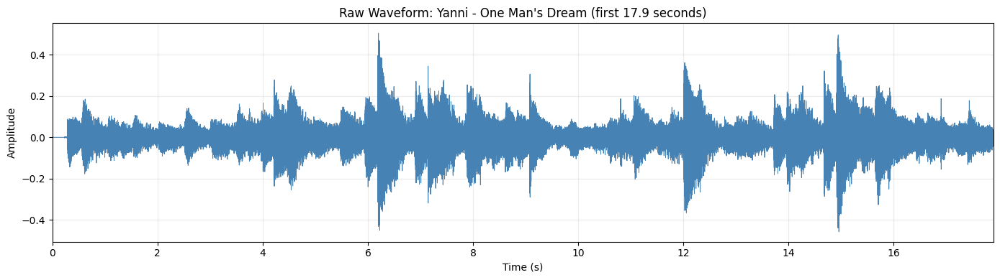

In [3]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

DURATION_SECONDS = 17.9
y, sample_rate = librosa.load(AUDIO_PATH, sr=None, mono=True, duration=DURATION_SECONDS)
time_axis = np.arange(len(y)) / sample_rate

plt.figure(figsize=(14, 4))
plt.plot(time_axis, y, color="steelblue", linewidth=0.7)
plt.xlim(0, DURATION_SECONDS)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Raw Waveform: Yanni - One Man's Dream (first 17.9 seconds)")
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

### 2. Spectrogram

The spectrogram shows how the signal's linear-frequency energy changes over time. Brighter regions indicate stronger frequency components.

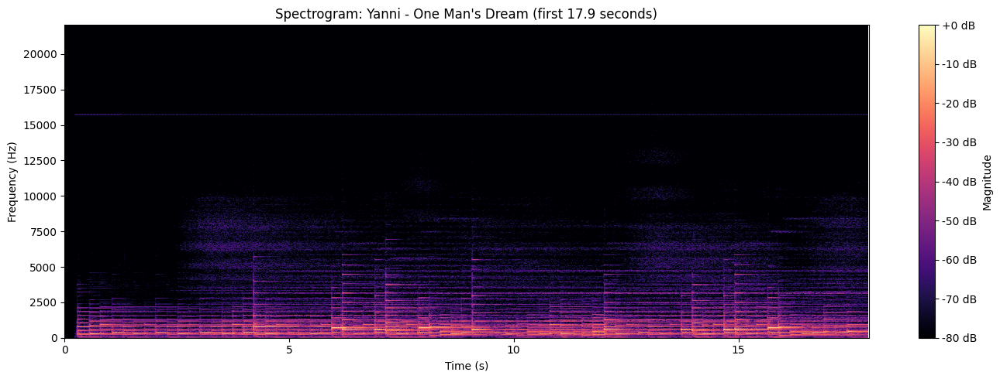

In [4]:
n_fft = 2048
hop_length = 512

stft = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
spectrogram_db = librosa.amplitude_to_db(np.abs(stft), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(
    spectrogram_db,
    sr=sample_rate,
    hop_length=hop_length,
    x_axis="time",
    y_axis="hz",
    cmap="magma",
)
plt.colorbar(format="%+2.0f dB", label="Magnitude")
plt.xlim(0, DURATION_SECONDS)
plt.ylim(0, sample_rate / 2)
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.title("Spectrogram: Yanni - One Man's Dream (first 17.9 seconds)")
plt.tight_layout()
plt.show()

### 3. Mel-Spectrogram

The mel-spectrogram maps frequency to the perceptual mel scale, emphasizing frequency relationships that are more meaningful for human hearing.

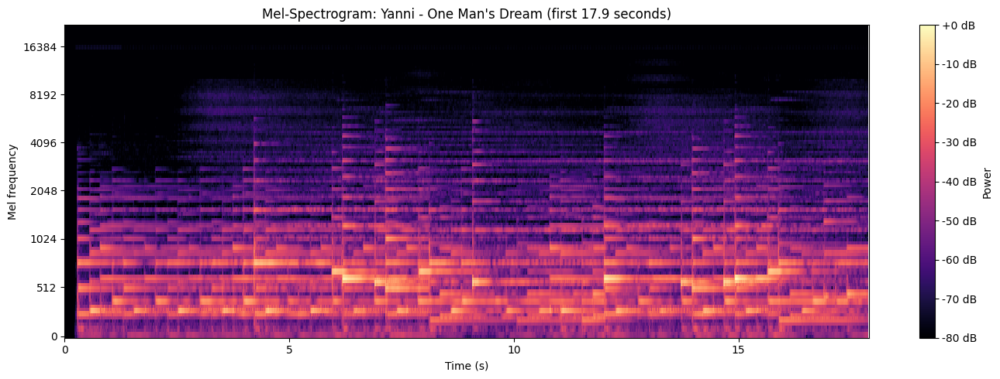

In [5]:
n_mels = 128
mel_spectrogram = librosa.feature.melspectrogram(
    y=y,
    sr=sample_rate,
    n_fft=n_fft,
    hop_length=hop_length,
    n_mels=n_mels,
    fmax=sample_rate / 2,
)
mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(
    mel_spectrogram_db,
    sr=sample_rate,
    hop_length=hop_length,
    x_axis="time",
    y_axis="mel",
    cmap="magma",
)
plt.colorbar(format="%+2.0f dB", label="Power")
plt.xlim(0, DURATION_SECONDS)
plt.xlabel("Time (s)")
plt.ylabel("Mel frequency")
plt.title("Mel-Spectrogram: Yanni - One Man's Dream (first 17.9 seconds)")
plt.tight_layout()
plt.show()

## Symbolic Representations

### 1. Music Score Notation

The next cell exports the first nine measures to MusicXML and opens it with the configured music21/MuseScore viewer. If MuseScore is not configured in music21, open the generated MusicXML file manually in MuseScore.

In [6]:
import json
import math
import mido
import music21 as m21
import pandas as pd
from IPython.display import FileLink, display

MIDI_PATH = Path("Musics") / "One Man's Dream.mid"
MIDI_SCORE_PATH = Path("Musics") / "One Man's Dream_first_9_measures.musicxml"

score = m21.converter.parse(str(MIDI_PATH))
score_excerpt = score.measures(1, 9)
score_excerpt.write("musicxml", fp=str(MIDI_SCORE_PATH))

print(f"MusicXML written to: {MIDI_SCORE_PATH}")
display(FileLink(str(MIDI_SCORE_PATH)))
try:
    score_excerpt.show("musicxml")
except Exception as error:
    print("MuseScore/music21 viewer could not be opened automatically:")
    print(error)
    print("Open the MusicXML link above in MuseScore to view standard staff notation.")

MusicXML written to: Musics\One Man's Dream_first_9_measures.musicxml


c:\Users\porip\Documents\Pouria Ar\PouriaEdu\University2\Master Thesis\Code\modules\utils\Music Representations\Musics\One Man's Dream_first_9_measures.musicxml

### 2. MIDI Messages

This table shows the MIDI messages in chronological order for the same first 17.9 seconds. Note-off messages are represented explicitly, including note-on messages with velocity zero.

In [7]:
MIDI_WINDOW_SECONDS = 17.9
ANALYSIS_TEMPO_BPM = 112
ANALYSIS_TEMPO_US_PER_BEAT = int(60_000_000 / ANALYSIS_TEMPO_BPM)
midi_file = mido.MidiFile(str(MIDI_PATH))
merged_track = mido.merge_tracks(midi_file.tracks)

def midi_note_name(note_number):
    return m21.pitch.Pitch(midi=note_number).nameWithOctave

message_rows = []
note_events = []
active_notes = {}
absolute_ticks = 0
absolute_seconds = 0.0
tempo = ANALYSIS_TEMPO_US_PER_BEAT

for message in merged_track:
    absolute_ticks += message.time
    absolute_seconds += mido.tick2second(message.time, midi_file.ticks_per_beat, tempo)

    if message.type == "set_tempo":
        tempo = ANALYSIS_TEMPO_US_PER_BEAT

    if absolute_seconds > MIDI_WINDOW_SECONDS:
        break

    row = {
        "time_s": round(absolute_seconds, 4),
        "delta_ticks": message.time,
        "type": message.type,
        "channel": getattr(message, "channel", None),
        "note": getattr(message, "note", None),
        "note_name": midi_note_name(message.note) if hasattr(message, "note") else None,
        "velocity": getattr(message, "velocity", None),
    }
    message_rows.append(row)

    is_note_on = message.type == "note_on" and message.velocity > 0
    is_note_off = message.type == "note_off" or (
        message.type == "note_on" and message.velocity == 0
    )
    note_key = (getattr(message, "channel", 0), getattr(message, "note", None))

    if is_note_on:
        active_notes.setdefault(note_key, []).append(
            (absolute_seconds, message.velocity)
        )
    elif is_note_off and note_key in active_notes and active_notes[note_key]:
        start_seconds, velocity = active_notes[note_key].pop(0)
        if start_seconds < MIDI_WINDOW_SECONDS:
            note_events.append({
                "start_s": start_seconds,
                "duration_s": max(0.0, absolute_seconds - start_seconds),
                "channel": note_key[0],
                "pitch": note_key[1],
                "note_name": midi_note_name(note_key[1]),
                "velocity": velocity,
            })

midi_messages_df = pd.DataFrame(message_rows)
note_events_df = pd.DataFrame(note_events).sort_values(
    ["start_s", "channel", "pitch"]
).reset_index(drop=True)

print(f"Analysis tempo: {ANALYSIS_TEMPO_BPM} BPM")
display(midi_messages_df)
print(f"Displayed {len(midi_messages_df)} MIDI messages and {len(note_events_df)} completed notes.")

Analysis tempo: 112 BPM


,time_s,delta_ticks,type,channel,note,note_name,velocity
0,0.0000,0,time_signature,NaN,NaN,None,NaN
1,0.0000,0,key_signature,NaN,NaN,None,NaN
2,0.0000,0,set_tempo,NaN,NaN,None,NaN
3,0.0000,0,midi_port,NaN,NaN,None,NaN
4,0.0000,0,track_name,NaN,NaN,None,NaN
...,...,...,...,...,...,...,...
175,17.1786,11,note_on,0.0,67.0,G4,0.0
176,17.3973,49,note_on,0.0,62.0,D4,98.0
177,17.5045,24,note_on,0.0,60.0,C4,0.0
178,17.6696,37,note_on,0.0,63.0,E-4,109.0


Displayed 180 MIDI messages and 67 completed notes.


### 3. REMI Representation

REMI (REvamped MIDI) represents the score as event tokens: bar, position, pitch, velocity, and duration. Here the sequence is quantized to 16th-note positions and restricted to the first 17.9 seconds.

In [8]:
quarter_seconds = tempo / 1_000_000
sixteenth_seconds = quarter_seconds / 4
steps_per_bar = 16

remi_tokens = []
remi_rows = []
previous_bar = None

for note in note_events_df.to_dict("records"):
    start_step = int(round(note["start_s"] / sixteenth_seconds))
    duration_steps = max(1, int(round(note["duration_s"] / sixteenth_seconds)))
    bar = start_step // steps_per_bar
    position = start_step % steps_per_bar

    if bar != previous_bar:
        remi_tokens.append(f"Bar_{bar + 1}")
        previous_bar = bar
    remi_tokens.extend([
        f"Position_{position}",
        f"Pitch_{note['pitch']}",
        f"Velocity_{note['velocity']}",
        f"Duration_{duration_steps}",
    ])
    remi_rows.append({
        "bar": bar + 1,
        "position_16th": position,
        "pitch": note["pitch"],
        "note_name": note["note_name"],
        "velocity": note["velocity"],
        "duration_16ths": duration_steps,
    })

remi_df = pd.DataFrame(remi_rows)
print("REMI token sequence:")
print(" ".join(remi_tokens))
display(remi_df)

REMI token sequence:
Bar_2 Position_0 Pitch_60 Velocity_111 Duration_2 Position_2 Pitch_62 Velocity_104 Duration_2 Position_4 Pitch_63 Velocity_111 Duration_2 Position_6 Pitch_67 Velocity_110 Duration_2 Position_8 Pitch_60 Velocity_111 Duration_3 Position_10 Pitch_62 Velocity_99 Duration_2 Position_12 Pitch_63 Velocity_113 Duration_2 Position_14 Pitch_67 Velocity_114 Duration_2 Bar_3 Position_0 Pitch_60 Velocity_117 Duration_3 Position_2 Pitch_62 Velocity_104 Duration_2 Position_4 Pitch_63 Velocity_116 Duration_2 Position_6 Pitch_67 Velocity_108 Duration_2 Position_8 Pitch_60 Velocity_101 Duration_3 Position_10 Pitch_62 Velocity_96 Duration_2 Position_12 Pitch_63 Velocity_111 Duration_2 Position_14 Pitch_67 Velocity_107 Duration_2 Bar_4 Position_0 Pitch_79 Velocity_114 Duration_14 Position_0 Pitch_60 Velocity_103 Duration_3 Position_2 Pitch_62 Velocity_98 Duration_2 Position_4 Pitch_63 Velocity_98 Duration_2 Position_6 Pitch_67 Velocity_114 Duration_2 Position_8 Pitch_60 Velocity_108 D

,bar,position_16th,pitch,note_name,velocity,duration_16ths
0,2,0,60,C4,111,2
1,2,2,62,D4,104,2
2,2,4,63,E-4,111,2
3,2,6,67,G4,110,2
4,2,8,60,C4,111,3
...,...,...,...,...,...,...
62,8,12,63,E-4,116,2
63,8,14,74,D5,91,2
64,8,14,67,G4,111,2
65,9,0,60,C4,98,3


### 4. Hold/Repeat Representation

This is the representation used by the LSTM preprocessing idea: a note name (or MIDI number) starts an event, `_` means the previous note is held, and `r` means rest. The sequence uses 16th-note steps, matching `time_step=0.25` quarter lengths in `preprocess.py`.

In [9]:
grid_steps = math.ceil(MIDI_WINDOW_SECONDS / sixteenth_seconds)
hold_repeat_rows = []
name_tokens = []
numeric_tokens = []

quantized_events = []
for note in note_events_df.to_dict("records"):
    start_step = int(round(note["start_s"] / sixteenth_seconds))
    duration_steps = max(1, int(round(note["duration_s"] / sixteenth_seconds)))
    quantized_events.append({
        "start_step": start_step,
        "end_step": start_step + duration_steps,
        "pitch": note["pitch"],
        "note_name": note["note_name"],
    })

for step in range(grid_steps):
    active_events = [
        event for event in quantized_events
        if event["start_step"] <= step < event["end_step"]
    ]
    onset_events = [
        event for event in active_events
        if event["start_step"] == step
    ]

    if onset_events:
        onset_events.sort(key=lambda event: event["pitch"])
        name_token = "+".join(event["note_name"] for event in onset_events)
        numeric_token = "+".join(str(event["pitch"]) for event in onset_events)
    elif active_events:
        name_token = "_"
        numeric_token = "_"
    else:
        name_token = "r"
        numeric_token = "r"

    name_tokens.append(name_token)
    numeric_tokens.append(numeric_token)
    hold_repeat_rows.append({
        "step": step,
        "time_s": round(step * sixteenth_seconds, 3),
        "bar": step // steps_per_bar + 1,
        "position_16th": step % steps_per_bar,
        "note_names": name_token,
        "midi_numbers": numeric_token,
    })

hold_repeat_df = pd.DataFrame(hold_repeat_rows)
print("Note-name sequence:")
print(" ".join(name_tokens))
print("\nNumeric sequence used by the LSTM-style encoding:")
print(" ".join(numeric_tokens))
display(hold_repeat_df)

Note-name sequence:
r r r r r r r r r r r r r r r r C4 _ D4 _ E-4 _ G4 _ C4 _ D4 _ E-4 _ G4 _ C4 _ D4 _ E-4 _ G4 _ C4 _ D4 _ E-4 _ G4 _ C4+G5 _ D4 _ E-4 _ G4 _ C4 _ D4 _ E-4 _ G4+F5 _ C4+E-5 _ D4 _ E-4 _ G4+D5 _ C4+C5 _ D4 _ E-4 _ G4+F5 _ G3+G5 _ B-3 _ D4 _ G4 _ D5 _ G4 _ D4 _ B-3 _ G3 _ B-3 _ D4 _ E-4 _ D4 _ B-3 _ G3 _ B-3 _ C4+E-5 _ D4 _ E-4 _ G4 _ C4 _ D4 _ E-4 _ G4+D5 _ C4 _ D4 _ r r

Numeric sequence used by the LSTM-style encoding:
r r r r r r r r r r r r r r r r 60 _ 62 _ 63 _ 67 _ 60 _ 62 _ 63 _ 67 _ 60 _ 62 _ 63 _ 67 _ 60 _ 62 _ 63 _ 67 _ 60+79 _ 62 _ 63 _ 67 _ 60 _ 62 _ 63 _ 67+77 _ 60+75 _ 62 _ 63 _ 67+74 _ 60+72 _ 62 _ 63 _ 67+77 _ 55+79 _ 58 _ 62 _ 67 _ 74 _ 67 _ 62 _ 58 _ 55 _ 58 _ 62 _ 63 _ 62 _ 58 _ 55 _ 58 _ 60+75 _ 62 _ 63 _ 67 _ 60 _ 62 _ 63 _ 67+74 _ 60 _ 62 _ r r


,step,time_s,bar,position_16th,note_names,midi_numbers
0,0,0.000,1,0,r,r
1,1,0.134,1,1,r,r
2,2,0.268,1,2,r,r
3,3,0.402,1,3,r,r
4,4,0.536,1,4,r,r
...,...,...,...,...,...,...
129,129,17.277,9,1,_,_
130,130,17.411,9,2,D4,62
131,131,17.545,9,3,_,_
132,132,17.679,9,4,r,r


## Visual Comparison of Symbolic Representations

The following figure uses the first two active measures. It is intentionally compact so the event labels remain readable, similar to the reference image.

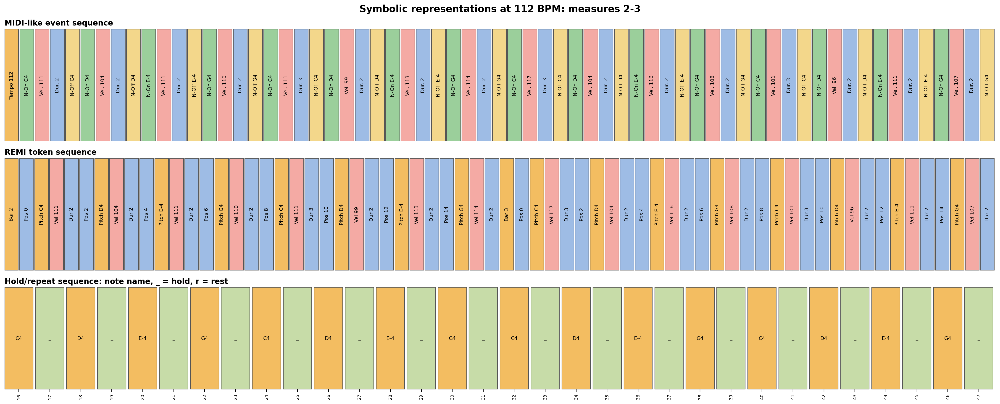

In [10]:
from matplotlib.patches import Rectangle

DISPLAY_MEASURES = 2
visual_start_step = int(
    note_events_df["start_s"].min() / sixteenth_seconds
)
visual_end_step = visual_start_step + DISPLAY_MEASURES * steps_per_bar

visual_notes = note_events_df.copy()
visual_notes["start_step"] = np.rint(
    visual_notes["start_s"] / sixteenth_seconds
).astype(int)
visual_notes["duration_steps"] = np.maximum(
    1, np.rint(visual_notes["duration_s"] / sixteenth_seconds).astype(int)
)
visual_notes = visual_notes[
    (visual_notes["start_step"] >= visual_start_step)
    & (visual_notes["start_step"] < visual_end_step)
]

palette = {
    "tempo": "#f3bd61",
    "note_on": "#9bcf9b",
    "velocity": "#f4aaa4",
    "duration": "#9ebce5",
    "note_off": "#f3d78b",
    "hold": "#c7dca8",
    "rest": "#e5e5e5",
    "note": "#f3bd61",
}


def draw_blocks(axis, blocks, title, label_rotation=90):
    for index, (label, color) in enumerate(blocks):
        axis.add_patch(
            Rectangle(
                (index, 0), 0.92, 1,
                facecolor=color,
                edgecolor="#555555",
                linewidth=0.8,
            )
        )
        axis.text(
            index + 0.46, 0.5, label,
            ha="center", va="center",
            rotation=label_rotation, fontsize=8,
        )
    axis.set_xlim(0, max(1, len(blocks)))
    axis.set_ylim(0, 1)
    axis.set_yticks([])
    axis.set_xticks([])
    axis.set_title(title, loc="left", fontweight="bold")
    axis.spines[:].set_visible(False)

midi_blocks = [(f"Tempo {ANALYSIS_TEMPO_BPM}", palette["tempo"])]
for note in visual_notes.to_dict("records"):
    midi_blocks.extend([
        (f"N-On {note['note_name']}", palette["note_on"]),
        (f"Vel. {note['velocity']}", palette["velocity"]),
        (f"Dur. {note['duration_steps']}", palette["duration"]),
        (f"N-Off {note['note_name']}", palette["note_off"]),
    ])

remi_visual = remi_df.copy()
remi_visual["start_step"] = (
    (remi_visual["bar"] - 1) * steps_per_bar
    + remi_visual["position_16th"]
)
remi_visual = remi_visual[
    (remi_visual["start_step"] >= visual_start_step)
    & (remi_visual["start_step"] < visual_end_step)
]
remi_blocks = []
last_bar = None
for row in remi_visual.to_dict("records"):
    if row["bar"] != last_bar:
        remi_blocks.append((f"Bar {row['bar']}", palette["tempo"]))
        last_bar = row["bar"]
    remi_blocks.extend([
        (f"Pos {row['position_16th']}", palette["duration"]),
        (f"Pitch {row['note_name']}", palette["note"]),
        (f"Vel {row['velocity']}", palette["velocity"]),
        (f"Dur {row['duration_16ths']}", palette["duration"]),
    ])

hold_visual = hold_repeat_df[
    (hold_repeat_df["step"] >= visual_start_step)
    & (hold_repeat_df["step"] < visual_end_step)
]
hold_blocks = []
for token in hold_visual["note_names"]:
    if token == "_":
        color = palette["hold"]
    elif token == "r":
        color = palette["rest"]
    else:
        color = palette["note"]
    hold_blocks.append((token, color))

figure, axes = plt.subplots(
    3, 1, figsize=(22, 9), gridspec_kw={"height_ratios": [1.1, 1.1, 1]}
)
draw_blocks(axes[0], midi_blocks, "MIDI-like event sequence")
draw_blocks(axes[1], remi_blocks, "REMI token sequence")
draw_blocks(axes[2], hold_blocks, "Hold/repeat sequence: note name, _ = hold, r = rest", 0)
axes[2].set_xticks(np.arange(len(hold_blocks)) + 0.46)
axes[2].set_xticklabels(
    [str(step) for step in hold_visual["step"]],
    rotation=90, fontsize=7,
)
figure.suptitle(
    f"Symbolic representations at {ANALYSIS_TEMPO_BPM} BPM: measures "
    f"{visual_start_step // steps_per_bar + 1}"
    f"-{(visual_end_step - 1) // steps_per_bar + 1}",
    fontsize=15, fontweight="bold",
)
figure.tight_layout()
plt.show()

## Thesis Figure: Two-Column Representation Comparison

This final figure aligns measures 3–4: score and three symbolic representations in the first column, and the corresponding waveform and spectrograms in the second column. The top-right cell is intentionally empty.

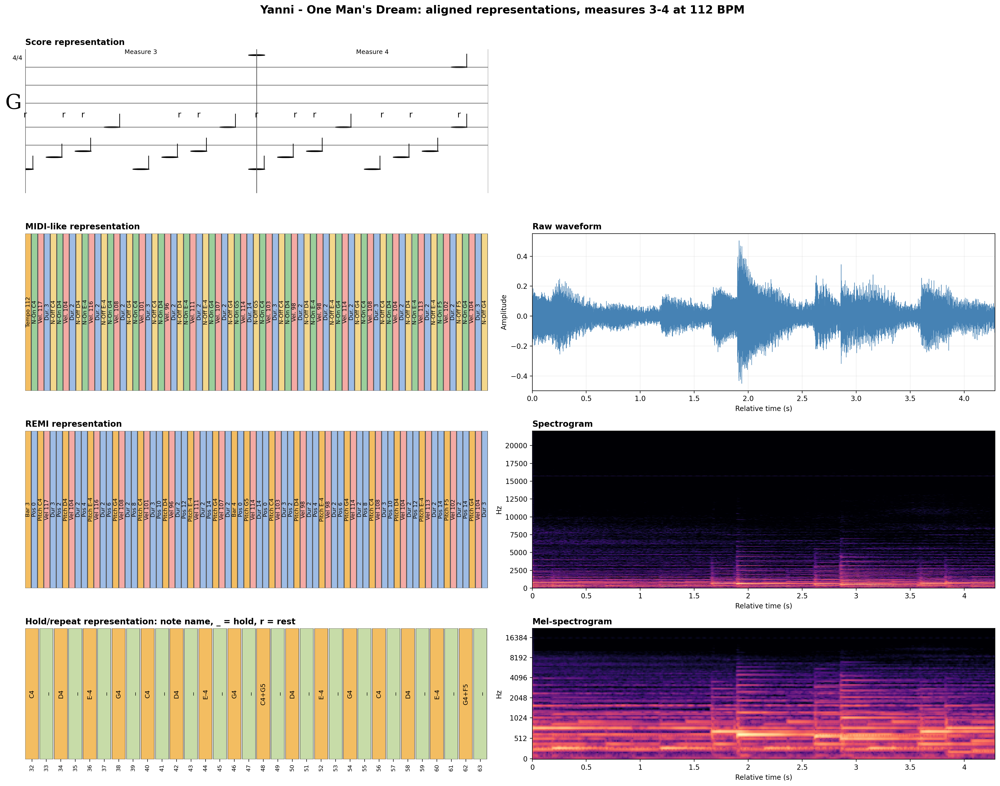

In [13]:
from matplotlib.patches import Ellipse

FIGURE_START_MEASURE = 3
FIGURE_MEASURE_COUNT = 2
FIGURE_END_MEASURE = FIGURE_START_MEASURE + FIGURE_MEASURE_COUNT - 1
FIGURE_START_STEP = (FIGURE_START_MEASURE - 1) * steps_per_bar
FIGURE_END_STEP = FIGURE_START_STEP + FIGURE_MEASURE_COUNT * steps_per_bar
FIGURE_START_SECONDS = FIGURE_START_STEP * sixteenth_seconds
FIGURE_END_SECONDS = FIGURE_END_STEP * sixteenth_seconds
FIGURE_DURATION_SECONDS = FIGURE_END_SECONDS - FIGURE_START_SECONDS

audio_start_index = int(round(FIGURE_START_SECONDS * sample_rate))
audio_end_index = int(round(FIGURE_END_SECONDS * sample_rate))
audio_segment = y[audio_start_index:audio_end_index]
audio_time = np.arange(len(audio_segment)) / sample_rate

figure_visual_notes = note_events_df.copy()
figure_visual_notes["start_step"] = np.rint(
    figure_visual_notes["start_s"] / sixteenth_seconds
).astype(int)
figure_visual_notes["duration_steps"] = np.maximum(
    1, np.rint(figure_visual_notes["duration_s"] / sixteenth_seconds).astype(int)
)
figure_visual_notes = figure_visual_notes[
    (figure_visual_notes["start_step"] >= FIGURE_START_STEP)
    & (figure_visual_notes["start_step"] < FIGURE_END_STEP)
]

figure_remi = remi_df.copy()
figure_remi["start_step"] = (
    (figure_remi["bar"] - 1) * steps_per_bar
    + figure_remi["position_16th"]
)
figure_remi = figure_remi[
    (figure_remi["start_step"] >= FIGURE_START_STEP)
    & (figure_remi["start_step"] < FIGURE_END_STEP)
]
figure_hold = hold_repeat_df[
    (hold_repeat_df["step"] >= FIGURE_START_STEP)
    & (hold_repeat_df["step"] < FIGURE_END_STEP)
]


def draw_staff_score(axis):
    axis.set_title("Score representation", loc="left", fontweight="bold")
    axis.set_xlim(0, FIGURE_MEASURE_COUNT * 4)
    axis.set_ylim(56, 80)
    axis.set_yticks([])
    axis.set_xticks([])
    for pitch in [64, 67, 71, 74, 77]:
        axis.axhline(pitch, color="#555555", linewidth=0.8)
    axis.text(-0.35, 71, "G", fontsize=30, fontfamily="serif", va="center")
    axis.text(-0.22, 78.5, "4/4", fontsize=9, va="center")

    for boundary in range(FIGURE_MEASURE_COUNT + 1):
        axis.axvline(boundary * 4, color="#555555", linewidth=1.0)
    for measure_number in range(FIGURE_START_MEASURE, FIGURE_END_MEASURE + 1):
        axis.text(
            (measure_number - FIGURE_START_MEASURE) * 4 + 2,
            79.2,
            f"Measure {measure_number}",
            ha="center",
            fontsize=9,
        )

    for measure in score.parts[0].getElementsByClass("Measure"):
        if measure.number not in range(FIGURE_START_MEASURE, FIGURE_END_MEASURE + 1):
            continue
        measure_x = (measure.number - FIGURE_START_MEASURE) * 4
        for event in measure.recurse().notesAndRests:
            event_x = measure_x + float(event.offset)
            if isinstance(event, m21.note.Rest):
                axis.text(event_x, 69, "r", ha="center", va="center", fontsize=12)
                continue
            pitches = event.pitches if isinstance(event, m21.chord.Chord) else [event.pitch]
            for pitch in pitches:
                pitch_midi = pitch.midi
                axis.add_patch(
                    Ellipse(
                        (event_x, pitch_midi), 0.28, 0.16,
                        facecolor="black", edgecolor="black",
                    )
                )
                if event.duration.quarterLength < 2:
                    axis.plot(
                        [event_x + 0.13, event_x + 0.13],
                        [pitch_midi, pitch_midi + 2.2],
                        color="black", linewidth=1,
                    )
    axis.spines[:].set_visible(False)


def draw_visual_blocks(axis, blocks, title, label_rotation=90, fontsize=7):
    for index, (label, color) in enumerate(blocks):
        axis.add_patch(
            Rectangle(
                (index, 0), 0.92, 1,
                facecolor=color,
                edgecolor="#555555",
                linewidth=0.7,
            )
        )
        axis.text(
            index + 0.46, 0.5, label,
            ha="center", va="center",
            rotation=label_rotation, fontsize=fontsize,
        )
    axis.set_xlim(0, max(1, len(blocks)))
    axis.set_ylim(0, 1)
    axis.set_yticks([])
    axis.set_xticks([])
    axis.set_title(title, loc="left", fontweight="bold")
    axis.spines[:].set_visible(False)

midi_blocks_figure = [(f"Tempo {ANALYSIS_TEMPO_BPM}", palette["tempo"])]
for note in figure_visual_notes.to_dict("records"):
    midi_blocks_figure.extend([
        (f"N-On {note['note_name']}", palette["note_on"]),
        (f"Vel. {note['velocity']}", palette["velocity"]),
        (f"Dur. {note['duration_steps']}", palette["duration"]),
        (f"N-Off {note['note_name']}", palette["note_off"]),
    ])

remi_blocks_figure = []
last_bar = None
for row in figure_remi.to_dict("records"):
    if row["bar"] != last_bar:
        remi_blocks_figure.append((f"Bar {row['bar']}", palette["tempo"]))
        last_bar = row["bar"]
    remi_blocks_figure.extend([
        (f"Pos {row['position_16th']}", palette["duration"]),
        (f"Pitch {row['note_name']}", palette["note"]),
        (f"Vel {row['velocity']}", palette["velocity"]),
        (f"Dur {row['duration_16ths']}", palette["duration"]),
    ])

hold_blocks_figure = []
for token in figure_hold["note_names"]:
    if token == "_":
        color = palette["hold"]
    elif token == "r":
        color = palette["rest"]
    else:
        color = palette["note"]
    hold_blocks_figure.append((token, color))

figure, axes = plt.subplots(
    4, 2,
    figsize=(20, 16),
    gridspec_kw={"height_ratios": [1.1, 1.2, 1.2, 1.0]},
)

draw_staff_score(axes[0, 0])
draw_visual_blocks(axes[1, 0], midi_blocks_figure, "MIDI-like representation", fontsize=8)
draw_visual_blocks(axes[2, 0], remi_blocks_figure, "REMI representation", fontsize=8)
draw_visual_blocks(
    axes[3, 0],
    hold_blocks_figure,
    "Hold/repeat representation: note name, _ = hold, r = rest",
    # label_rotation=0,
    fontsize=9,
)
axes[3, 0].set_xticks(np.arange(len(hold_blocks_figure)) + 0.46)
axes[3, 0].set_xticklabels(
    [str(step) for step in figure_hold["step"]],
    rotation=90, fontsize=8,
)

axes[0, 1].axis("off")

axes[1, 1].plot(audio_time, audio_segment, color="steelblue", linewidth=0.6)
axes[1, 1].set_xlim(0, FIGURE_DURATION_SECONDS)
axes[1, 1].set_xlabel("Relative time (s)")
axes[1, 1].set_ylabel("Amplitude")
axes[1, 1].set_title("Raw waveform", loc="left", fontweight="bold")
axes[1, 1].grid(alpha=0.2)

figure_stft = librosa.stft(audio_segment, n_fft=n_fft, hop_length=hop_length)
figure_spectrogram_db = librosa.amplitude_to_db(np.abs(figure_stft), ref=np.max)
librosa.display.specshow(
    figure_spectrogram_db,
    sr=sample_rate,
    hop_length=hop_length,
    x_axis="time",
    y_axis="hz",
    cmap="magma",
    ax=axes[2, 1],
)
axes[2, 1].set_xlim(0, FIGURE_DURATION_SECONDS)
axes[2, 1].set_ylim(0, sample_rate / 2)
axes[2, 1].set_xlabel("Relative time (s)")
axes[2, 1].set_title("Spectrogram", loc="left", fontweight="bold")

figure_mel = librosa.feature.melspectrogram(
    y=audio_segment,
    sr=sample_rate,
    n_fft=n_fft,
    hop_length=hop_length,
    n_mels=n_mels,
    fmax=sample_rate / 2,
)
figure_mel_db = librosa.power_to_db(figure_mel, ref=np.max)
librosa.display.specshow(
    figure_mel_db,
    sr=sample_rate,
    hop_length=hop_length,
    x_axis="time",
    y_axis="mel",
    cmap="magma",
    ax=axes[3, 1],
)
axes[3, 1].set_xlim(0, FIGURE_DURATION_SECONDS)
axes[3, 1].set_xlabel("Relative time (s)")
axes[3, 1].set_title("Mel-spectrogram", loc="left", fontweight="bold")

figure.suptitle(
    f"Yanni - One Man's Dream: aligned representations, measures "
    f"{FIGURE_START_MEASURE}-{FIGURE_END_MEASURE} at {ANALYSIS_TEMPO_BPM} BPM",
    fontsize=16,
    fontweight="bold",
)
figure.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()